Introduction
============

This is an interactive notebook regarding "Introduction to path planning". (Author: Björn Hein)

Version | Author
------------ | -------------
0.2 | Björn Hein


License is based on Creative Commons: Attribution-NonCommercial 4.0 International (CC BY-NC 4.0) (please check: http://creativecommons.org/licenses/by-nc/4.0/)

This notebook imports all discussed algorithms and does a comparison

Important links are:

* General Info: http://www.python.org
* Python tutorial http://www.python.org/doc/tut/
* NetworkX http://networkx.github.io/
* NumPy and SciPy Guide http://docs.scipy.org/
* Matplotlib gallery http://matplotlib.sourceforge.net/gallery.html


Remember that:

* you have to press ctrl-return or shift-return, to execute the code in the code sections, only then the variables are "generated" and can be used
* you can execute the whole notebook by Cell->runAll

Adding all planners
===========


In [1]:
import matplotlib.pylab as plt
%matplotlib inline
from IPPerfMonitor import IPPerfMonitor
import IPBasicPRM
import IPVISBasicPRM
from IPNodeSampling import PathLocalSampler, BridgeSampler

import IPVisibilityPRM
import IPVISVisibilityPRM

import IPLazyPRM
import IPVISLazyPRM
import IPEarlyPRM

import IPRRT
import IPVISRRT

import IPAStar
import IPVISAStar

import IPEarlyPRM
import pandas as pd
import numpy as np
import random

Set-up of the test scenario and the configuration for all planners
===================================

Following a procedure to compare all discussed planners are shown:

1. Configuration for every planner is defined
2. The configuration and the planner is stored in the variable setup, a Python dict()
3. The variable setup is then used to uniformly execute the planners


In [2]:
plannerFactory = dict()

basicConfig = dict()
basicConfig["radius"] = 3
basicConfig["numNodes"] = 200
plannerFactory["basePRM"] = [IPBasicPRM.BasicPRM, basicConfig, IPVISBasicPRM.basicPRMVisualize]


basicConfig2 = dict()
basicConfig2["radius"] = 6
basicConfig2["numNodes"] = 600
plannerFactory["basePRM2"] = [IPBasicPRM.BasicPRM, basicConfig2, IPVISBasicPRM.basicPRMVisualize]

basicConfig3 = dict()
basicConfig3["radius"] = 15
basicConfig3["numNodes"] = 300
plannerFactory["basePRM3"] = [IPBasicPRM.BasicPRM, basicConfig3, IPVISBasicPRM.basicPRMVisualize]

visibilityConfig = dict()
visibilityConfig["ntry"] = 300
plannerFactory["visibilityPRM"] = [IPVisibilityPRM.VisPRM, visibilityConfig, IPVISVisibilityPRM.visibilityPRMVisualize ]

lazyConfig = dict()
lazyConfig["initialRoadmapSize"] = 10
lazyConfig["updateRoadmapSize"]  = 5 
lazyConfig["kNearest"] = 8
lazyConfig["maxIterations"] = 20
plannerFactory["lazyPRM"] = [IPLazyPRM.LazyPRM, lazyConfig, IPVISLazyPRM.lazyPRMVisualize]

astarConfig = dict()
astarConfig["heuristic"] = 'euclidean' 
astarConfig["w"]  = 0.5
plannerFactory["astar"] = [IPAStar.AStar, astarConfig, IPVISAStar.aStarVisualize]

astarConfig2 = dict()
astarConfig2["heuristic"] = 'euclidean' 
astarConfig2["w"]  = 0.9
plannerFactory["astar2"] = [IPAStar.AStar, astarConfig2, IPVISAStar.aStarVisualize]


rrtSimpleConfig = dict()
rrtSimpleConfig["numberOfGeneratedNodes"] = 100 
rrtSimpleConfig["testGoalAfterNumberOfNodes"]  = 10
plannerFactory["simpleRRT"] = [IPRRT.RRTSimple, rrtSimpleConfig, IPVISRRT.rrtPRMVisualize]




In [3]:
class ResultCollection (object):
    
    def __init__(self, plannerFactoryName, planner, benchmark, solution, perfDataFrame):
        self.plannerFactoryName = plannerFactoryName
        self.planner = planner
        self.benchmark = benchmark
        self.solution = solution
        self.perfDataFrame = perfDataFrame

In [4]:
import IPTestSuite as ts
from shapely.geometry import Point, Polygon, LineString
from shapely import plotting


In [5]:
#import importlib
#importlib.reload(IPTestSuiteSS2024)

In [6]:
fullBenchList = ts.benchList

for benchmark in fullBenchList:
    print(benchmark.name)

Trap
Bottleneck
Fat bottleneck
MyField
Zigzag Traps
Empty Field
Clutter Forest
Dual Path
Nested Trap
Giant Square


## Task 8 Benchmark Design

This section defines the Task 8 benchmark evaluation for 2-DoF point robots. We select three representative environments with increasing complexity, and evaluate six planner variants across 30 runs per benchmark.

Selected benchmarks:
- **Empty Field** — easy, open space with no obstacles.
- **Bottleneck** — medium difficulty, requires finding a narrow passage.
- **Nested Trap** — hard, requires escaping a trapped region and finding a path out.

Tracked metrics:
- success rate
- planning time
- roadmap size (number of nodes)
- path point count
- path length
- collision checks: point and line
- enhancement rounds and enhancement nodes added

In [7]:
selected_benchmarks = [b for b in ts.benchList if b.name in ["Empty Field", "Bottleneck", "Nested Trap"]]
print("Selected benchmarks:")
for benchmark in selected_benchmarks:
    print("-", benchmark.name)

variant_definitions = [
    ("LazyPRM", lambda env: IPLazyPRM.LazyPRM(env)),
    ("EarlyPRM", lambda env: IPEarlyPRM.EarlyPRM(env)),
    ("LazyPRM_CollidingEdge", lambda env: IPLazyPRM.LazyPRM(env, enhancer=PathLocalSampler())),
    ("LazyPRM_Bridge", lambda env: IPLazyPRM.LazyPRM(env, enhancer=BridgeSampler())),
    ("EarlyPRM_CollidingEdge", lambda env: IPEarlyPRM.EarlyPRM(env, enhancer=PathLocalSampler())),
    ("EarlyPRM_Bridge", lambda env: IPEarlyPRM.EarlyPRM(env, enhancer=BridgeSampler())),
]

benchmark_config = dict(
    initialRoadmapSize=10,
    updateRoadmapSize=5,
    kNearest=8,
    maxIterations=30,
)

experiment_records = []

for benchmark in selected_benchmarks:
    for variant_name, constructor in variant_definitions:
        for run_index in range(30):
            random.seed(run_index)
            IPPerfMonitor.clearData()
            planner = constructor(benchmark.collisionChecker)
            solution = []
            try:
                solution = planner.planPath(benchmark.startList, benchmark.goalList, benchmark_config)
            except Exception as e:
                solution = []

            df = IPPerfMonitor.dataFrame()
            plan_time = df[df.name == "planPath"]["time"].sum() if not df.empty else np.nan
            point_checks = df[df.name == "pointInCollision"].shape[0] if not df.empty else 0
            line_checks = df[df.name == "lineInCollision"].shape[0] if not df.empty else 0
            path_points = len(solution)
            path_distance = 0.0
            if path_points > 1:
                positions = [planner.graph.nodes[node_id]["pos"] for node_id in solution]
                deltas = [np.linalg.norm(np.subtract(positions[i + 1], positions[i])) for i in range(path_points - 1)]
                path_distance = float(np.sum(deltas))

            experiment_records.append({
                "benchmark": benchmark.name,
                "variant": variant_name,
                "run": run_index,
                "success": int(bool(solution)),
                "planning_time": float(plan_time),
                "roadmap_nodes": planner.graph.number_of_nodes(),
                "path_points": path_points,
                "path_length": path_distance,
                "point_checks": point_checks,
                "line_checks": line_checks,
                "enhancement_rounds": getattr(planner, "enhancementRounds", 0),
                "enhancement_nodes": getattr(planner, "enhancementNodesAdded", 0),
            })

results_df = pd.DataFrame(experiment_records)
results_df.to_csv("task8_benchmark_results.csv", index=False)
results_df.head()

Selected benchmarks:
- Bottleneck
- Empty Field
- Nested Trap


,benchmark,variant,run,success,planning_time,roadmap_nodes,path_points,path_length,point_checks,line_checks,enhancement_rounds,enhancement_nodes
0,Bottleneck,LazyPRM,0,0,0.384223,153,0,0.000000,8910,253,30,150
1,Bottleneck,LazyPRM,1,1,0.014340,12,4,30.191739,413,13,0,0
2,Bottleneck,LazyPRM,2,1,0.016959,11,4,39.922621,463,14,0,0
3,Bottleneck,LazyPRM,3,1,0.075864,51,6,32.006350,2142,61,9,45
4,Bottleneck,LazyPRM,4,0,0.244166,156,0,0.000000,6766,218,30,150


In [8]:
summary_df = results_df.groupby(["benchmark", "variant"]).agg(
    success_rate=("success", "mean"),
    planning_time_mean=("planning_time", "mean"),
    planning_time_std=("planning_time", "std"),
    roadmap_nodes_mean=("roadmap_nodes", "mean"),
    roadmap_nodes_std=("roadmap_nodes", "std"),
    path_points_mean=("path_points", "mean"),
    path_points_std=("path_points", "std"),
    path_length_mean=("path_length", "mean"),
    path_length_std=("path_length", "std"),
    point_checks_mean=("point_checks", "mean"),
    point_checks_std=("point_checks", "std"),
    line_checks_mean=("line_checks", "mean"),
    line_checks_std=("line_checks", "std"),
    enhancement_rounds_mean=("enhancement_rounds", "mean"),
    enhancement_nodes_mean=("enhancement_nodes", "mean"),
).reset_index()

summary_df["success_rate"] = summary_df["success_rate"].round(2)
summary_df["planning_time_mean"] = summary_df["planning_time_mean"].round(3)
summary_df["planning_time_std"] = summary_df["planning_time_std"].round(3)
summary_df["path_length_mean"] = summary_df["path_length_mean"].round(3)
summary_df["point_checks_mean"] = summary_df["point_checks_mean"].round(1)
summary_df["line_checks_mean"] = summary_df["line_checks_mean"].round(1)
summary_df

,benchmark,variant,success_rate,planning_time_mean,planning_time_std,roadmap_nodes_mean,roadmap_nodes_std,path_points_mean,path_points_std,path_length_mean,path_length_std,point_checks_mean,point_checks_std,line_checks_mean,line_checks_std,enhancement_rounds_mean,enhancement_nodes_mean
0,Bottleneck,EarlyPRM,0.87,0.089,0.106,43.166667,52.828338,4.066667,1.855715,25.305,11.305366,2285.5,2603.946709,74.7,82.554865,6.566667,31.566667
1,Bottleneck,EarlyPRM_Bridge,1.00,0.175,0.200,30.066667,24.292660,5.033333,1.066200,30.462,5.881176,5088.4,5861.145832,76.1,73.256721,3.800000,18.466667
2,Bottleneck,EarlyPRM_CollidingEdge,0.97,0.074,0.089,28.800000,27.237651,5.066667,1.595972,30.971,8.532072,2027.5,2288.224515,64.7,69.042790,4.833333,17.200000
3,Bottleneck,LazyPRM,0.87,0.097,0.112,45.800000,52.357788,4.233333,1.924136,25.621,11.620676,2558.5,2804.825334,78.0,83.366860,7.133333,35.666667
4,Bottleneck,LazyPRM_Bridge,1.00,0.186,0.204,30.866667,23.900272,5.200000,1.095445,31.221,6.236599,5433.0,5938.675439,77.5,72.373901,3.966667,19.833333
5,Bottleneck,LazyPRM_CollidingEdge,1.00,0.094,0.105,31.400000,27.541317,5.666667,1.422318,33.146,6.940363,2472.3,2664.281739,73.2,75.969905,4.833333,24.166667
6,Empty Field,EarlyPRM,1.00,0.001,0.000,12.000000,0.000000,3.233333,0.430183,23.315,4.906092,103.6,17.637506,2.2,0.430183,0.000000,0.000000
7,Empty Field,EarlyPRM_Bridge,1.00,0.001,0.000,12.000000,0.000000,3.233333,0.430183,23.315,4.906092,103.6,17.637506,2.2,0.430183,0.000000,0.000000
8,Empty Field,EarlyPRM_CollidingEdge,1.00,0.001,0.000,12.000000,0.000000,3.233333,0.430183,23.315,4.906092,103.6,17.637506,2.2,0.430183,0.000000,0.000000
9,Empty Field,LazyPRM,1.00,0.001,0.000,12.000000,0.000000,3.233333,0.430183,23.315,4.906092,96.8,18.067689,2.2,0.430183,0.000000,0.000000


In [9]:
resultList = list()
testList = fullBenchList

for key,producer in list(plannerFactory.items()):
    print(key, producer)
    for benchmark in testList:
        print ("Planning: " + key + " - " + benchmark.name)
        #planner = IPBasicPRM.BasicPRM(benchmark.collisionChecker)
        planner = producer[0](benchmark.collisionChecker)
        IPPerfMonitor.clearData()
        try:
            
            resultList.append(ResultCollection(key,
                                          planner, 
                                           benchmark, 
                                           planner.planPath(benchmark.startList,benchmark.goalList,producer[1]),
                                           IPPerfMonitor.dataFrame()
                                          ),
                        )
        except Exception as e:
        #    throw e
            print ("PLANNING ERROR ! PLANNING ERROR ! PLANNING ERROR ", e)
            pass
            



basePRM [<class 'IPBasicPRM.BasicPRM'>, {'radius': 3, 'numNodes': 200}, <function basicPRMVisualize at 0x000002ABF32984A0>]
Planning: basePRM - Trap
Planning: basePRM - Bottleneck
Planning: basePRM - Fat bottleneck
Planning: basePRM - MyField
Planning: basePRM - Zigzag Traps
Planning: basePRM - Empty Field
Planning: basePRM - Clutter Forest
Planning: basePRM - Dual Path
Planning: basePRM - Nested Trap
Planning: basePRM - Giant Square
basePRM2 [<class 'IPBasicPRM.BasicPRM'>, {'radius': 6, 'numNodes': 600}, <function basicPRMVisualize at 0x000002ABF32984A0>]
Planning: basePRM2 - Trap
Planning: basePRM2 - Bottleneck
Planning: basePRM2 - Fat bottleneck
Planning: basePRM2 - MyField
Planning: basePRM2 - Zigzag Traps
Planning: basePRM2 - Empty Field
Planning: basePRM2 - Clutter Forest
Planning: basePRM2 - Dual Path
Planning: basePRM2 - Nested Trap
Planning: basePRM2 - Giant Square
basePRM3 [<class 'IPBasicPRM.BasicPRM'>, {'radius': 15, 'numNodes': 300}, <function basicPRMVisualize at 0x000002

c:\Users\erics\Uni\Innovative_Konzepte\Abgabe\intro-path-planning\venv\Lib\site-packages\networkx\drawing\nx_pylab.py:1497: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(
C:\Users\erics\AppData\Local\Temp\ipykernel_35560\3627444553.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig_local = plt.figure(figsize=(10,10))


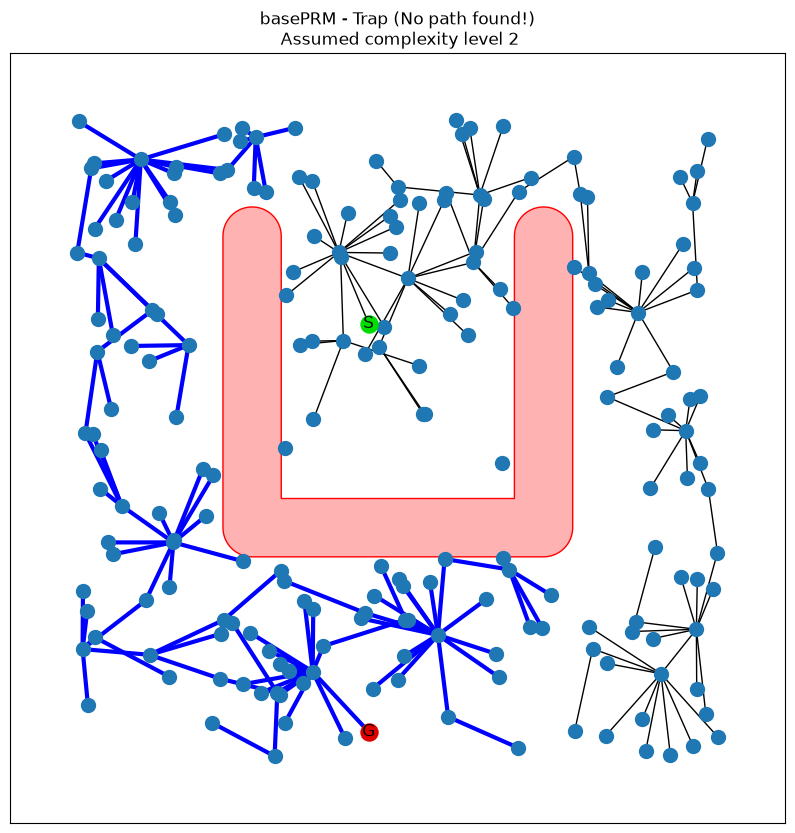

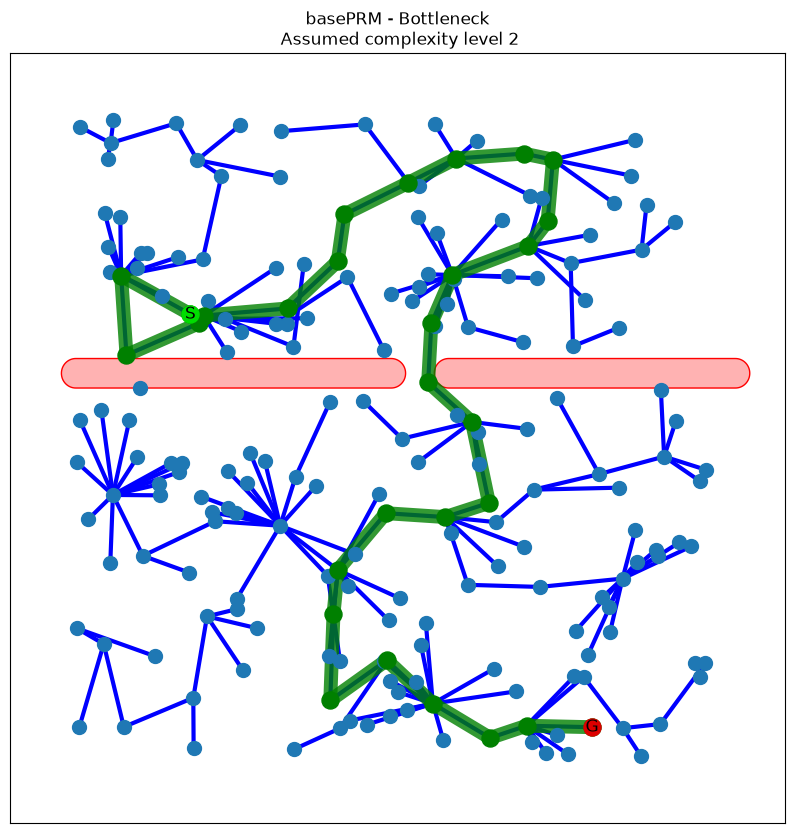

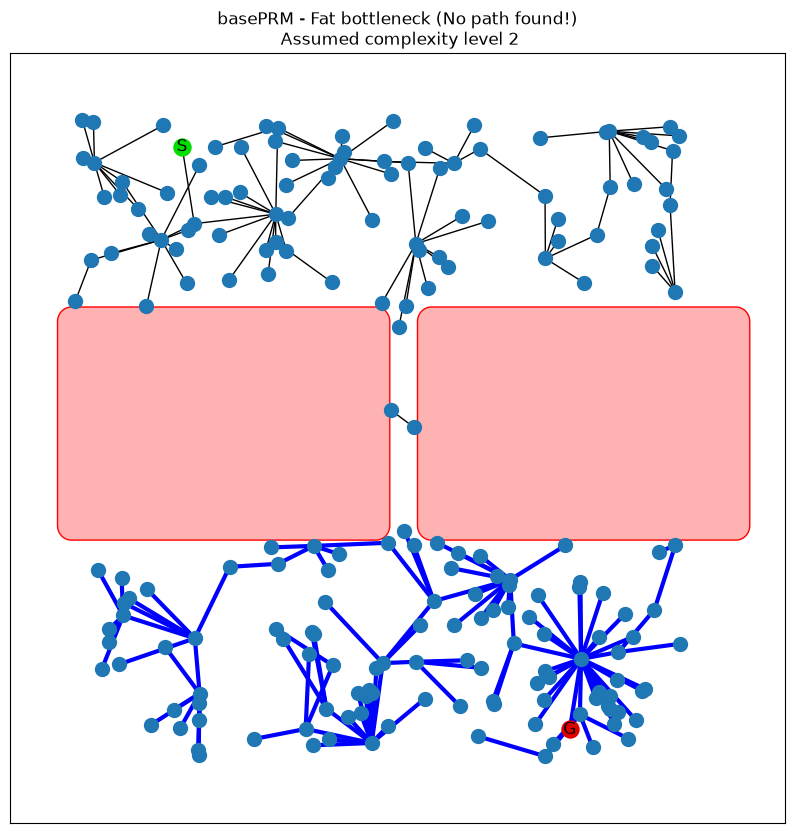

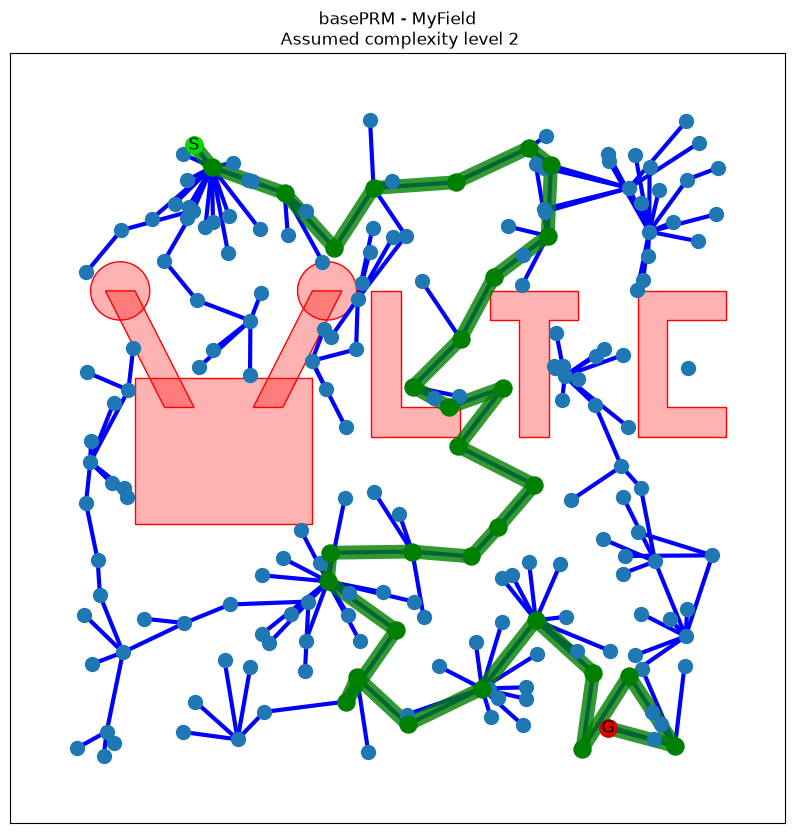

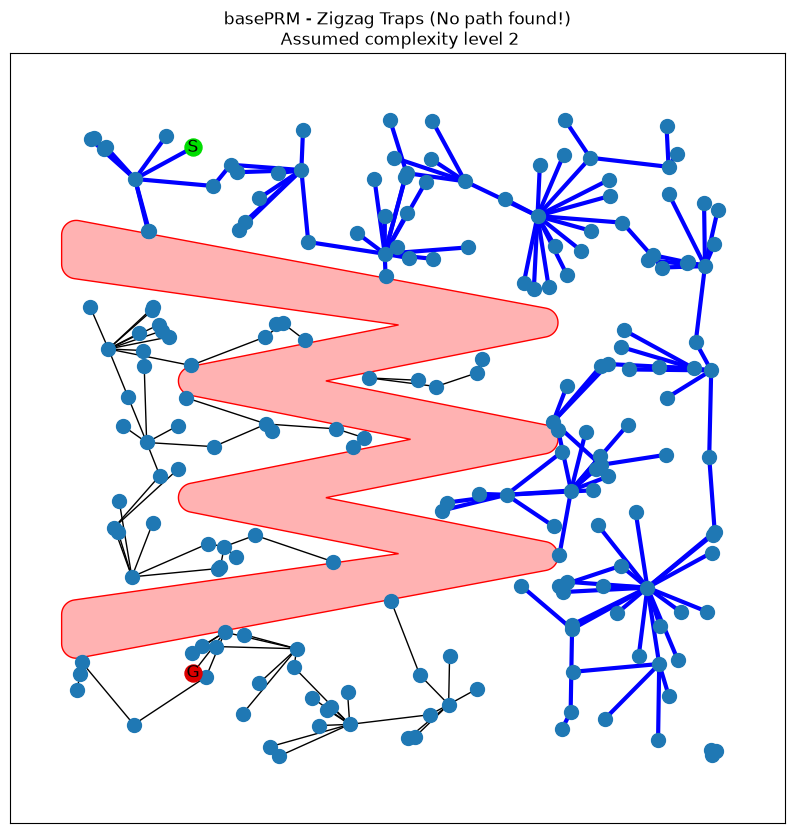

...

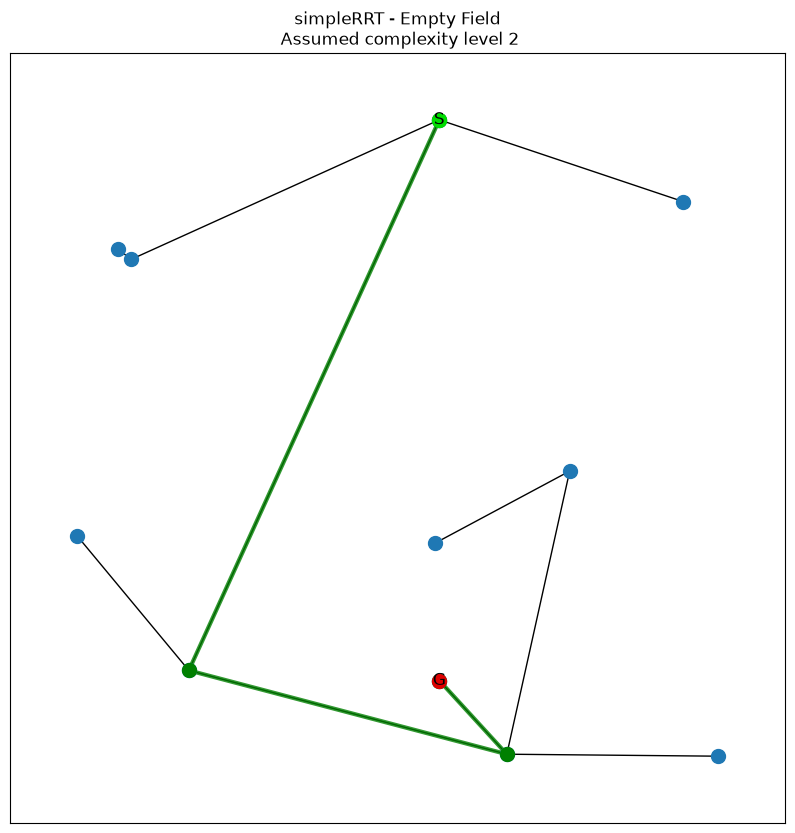

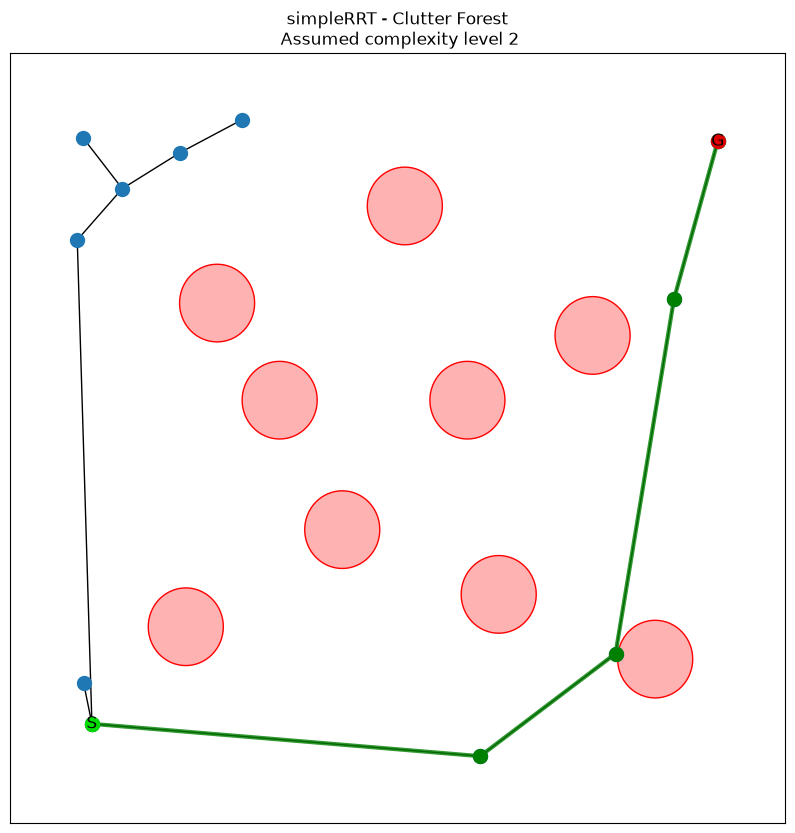

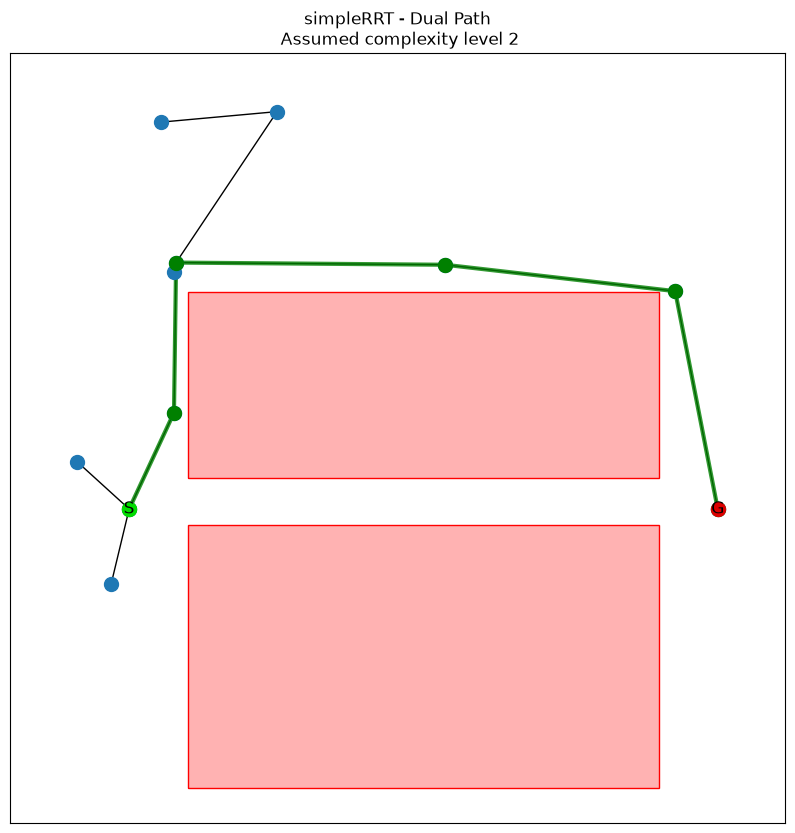

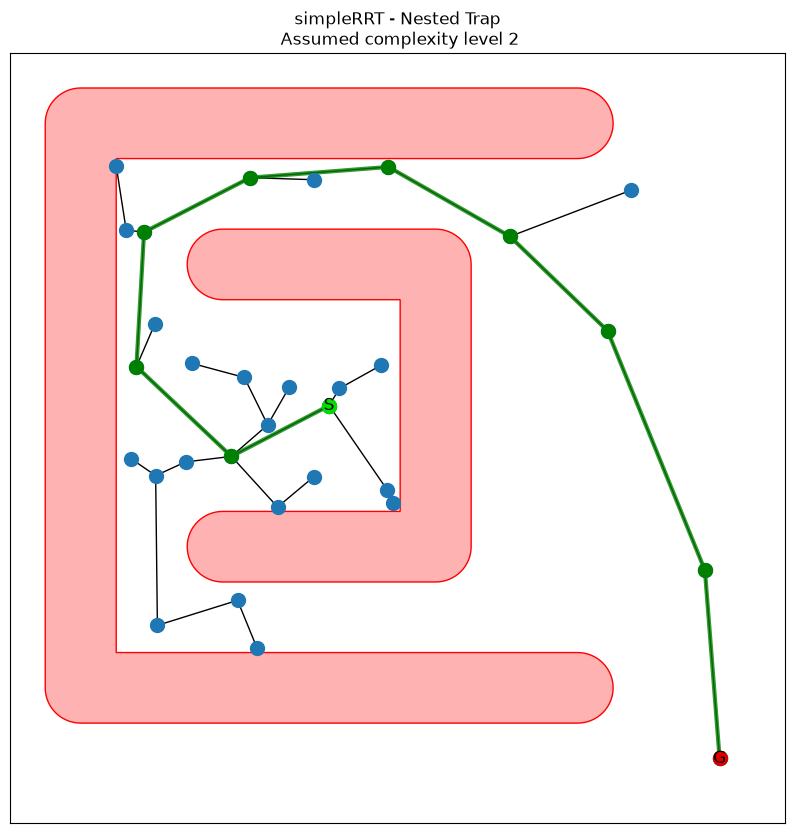

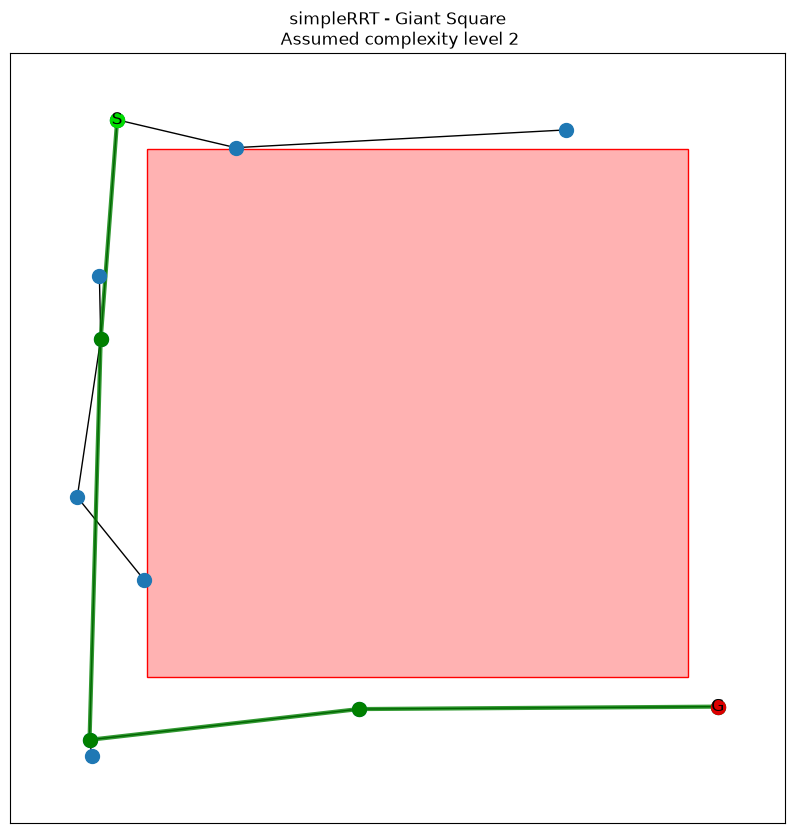

In [10]:
import matplotlib.pyplot as plt

for result in resultList:
    
    fig_local = plt.figure(figsize=(10,10))
    ax = fig_local.add_subplot(1,1,1)
    title = result.plannerFactoryName + " - " + result.benchmark.name
    if result.solution == []:
        title += " (No path found!)"
    title += "\n Assumed complexity level " + str(result.benchmark.level)
    ax.set_title(title)
    try:
        #IPVISBasicPRM.basicPRMVisualize(result.planner, result.solution, ax=ax, nodeSize=100))
        plannerFactory[result.plannerFactoryName][2](result.planner, result.solution, ax=ax, nodeSize=100)
    except Exception as e:
        print ("Error", e)
        pass
    

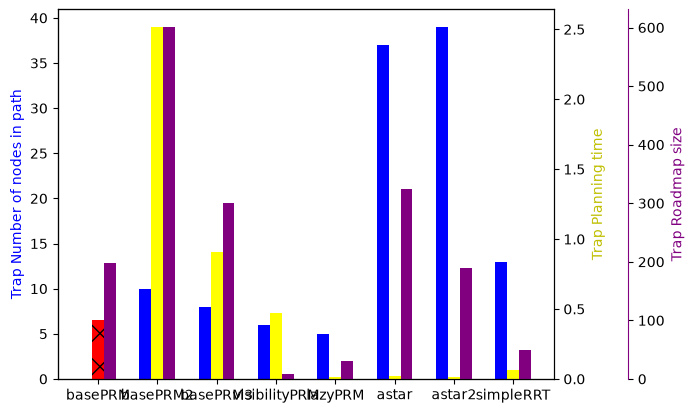

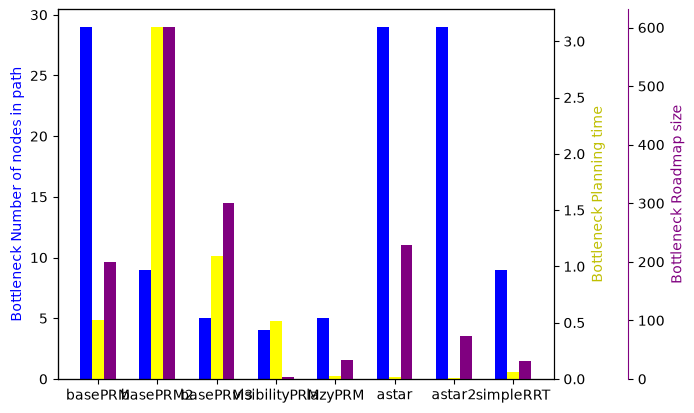

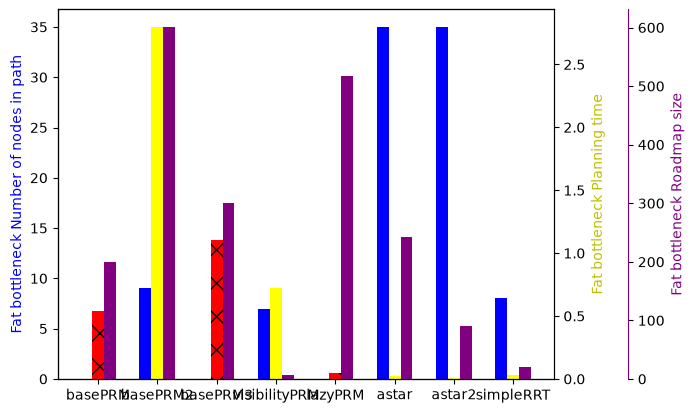

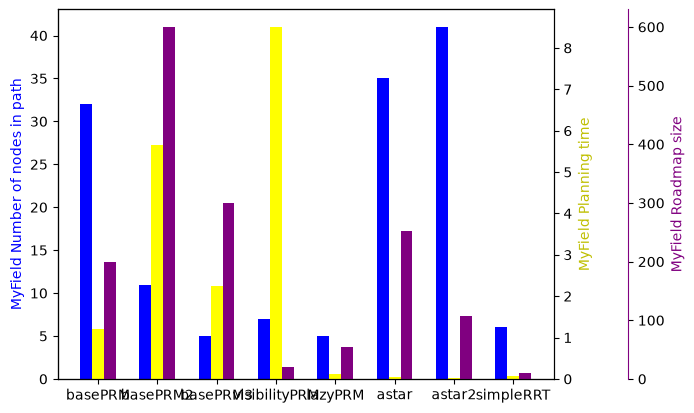

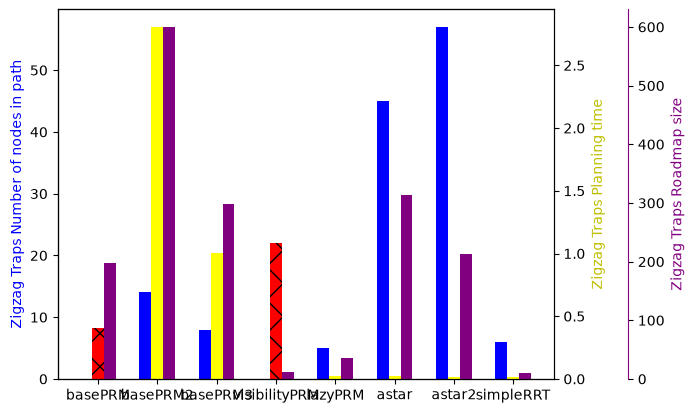

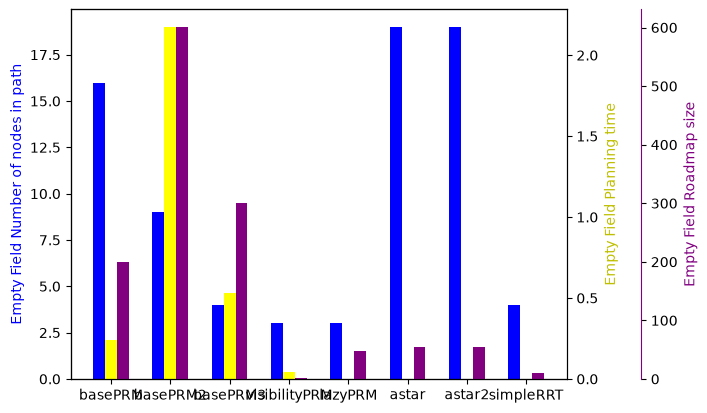

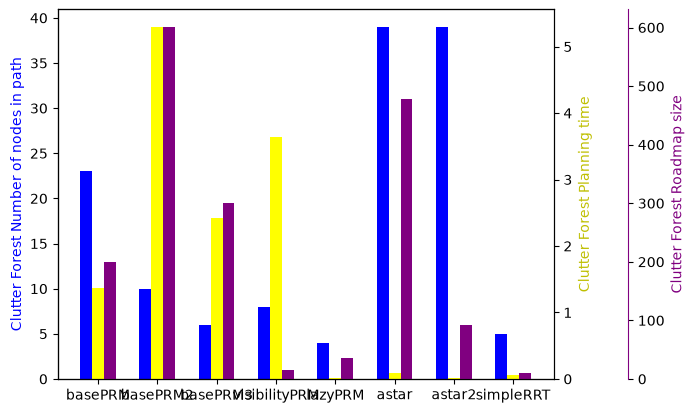

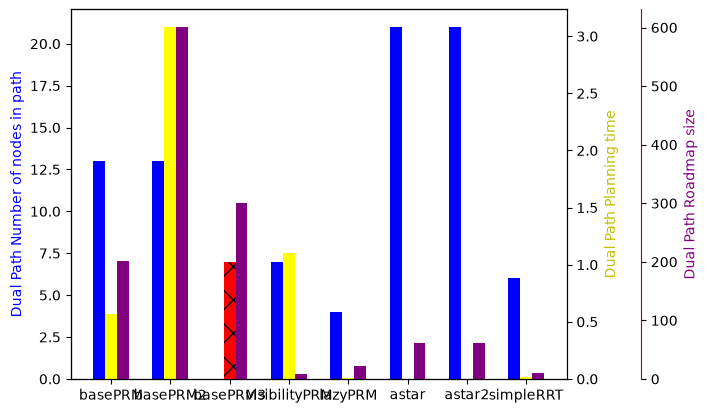

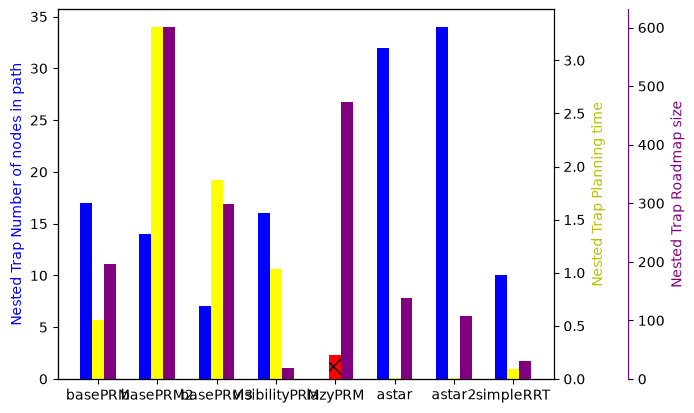

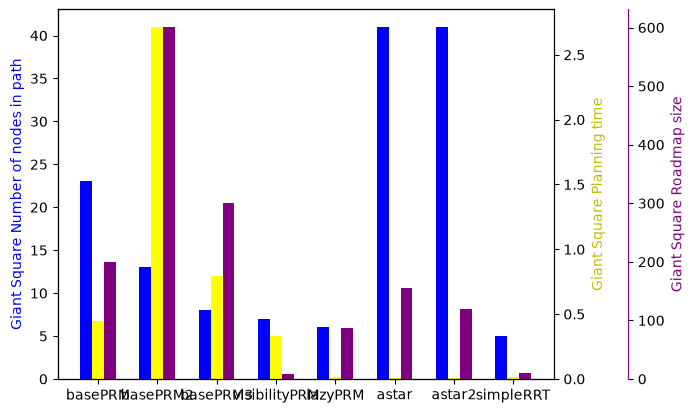

In [11]:
import numpy as np
for bench in testList:
    title = bench.name
    pathLength = dict()
    planningTime = dict()
    roadmapSize  = dict()
    
    try:
        for result in resultList:
            if result.benchmark.name == bench.name:
                #print result.benchmark.name  + " - " +  result.plannerFactoryName, len(result.solution)
                pathLength[result.plannerFactoryName] = len(result.solution)
                planningTime[result.plannerFactoryName] = result.perfDataFrame.groupby(["name"]).sum(numeric_only=True)["time"]["planPath"]
                roadmapSize[result.plannerFactoryName] = result.planner.graph.size()


        fig, ax = plt.subplots()

        width = 0.2

        ax.bar(np.arange(len(pathLength.keys())), pathLength.values(),width, color="blue")
        ax.set_ylabel(title + " Number of nodes in path", color="blue")
        ax.set_xticks(np.arange(len(pathLength.keys())) + width)
        ax.set_xticklabels(pathLength.keys())

        ax2 = ax.twinx()
        bar = ax2.bar(np.arange(len(pathLength.keys()))+width, planningTime.values(),width, color="red")
        ax2.set_ylabel(title + " Planning time", color="y")

        # Add coloring and patterns on axis two
        hatches = ['x' if length==0 else '' for length in pathLength.values()]
        color   = ['red' if length==0 else 'yellow' for length in pathLength.values()]
        for i,thisbar in enumerate(bar.patches):
            thisbar.set_facecolor(color[i])
            thisbar.set_hatch(hatches[i])

        # Multiple axes 
        ax3 = ax.twinx()
        ax3.bar(np.arange(len(pathLength.keys()))+2*width, roadmapSize.values(),width, color="purple")
        ax3.set_ylabel(title + " Roadmap size",  color="purple")
        ax3.spines['right'].set_position(('axes', 1.15))
        ax3.spines['right'].set_color("purple")
    except:
        pass


    
        
    